# Lab. Filters and Edges

At the end of this laboratory, you would get familiarized with

*   Convolution
*   Image Filters
*   Edge detection
---

In [54]:
# Loading necessary libraries (Feel free to add new libraries if you need for any computation)

import numpy as np
from matplotlib import pyplot as plt
from skimage import color, data, exposure, feature, filters, io, morphology, util

# Convolution
Hint: 
*   *convolve function is available in scipy.ndimage module*
*   The mask has to be normalized before convolving with the image

### Exercise:
*   Read 'camera' image from the data module
*   Convolve the image with a horizontal mask:  (1 x 15) with all values set to ones


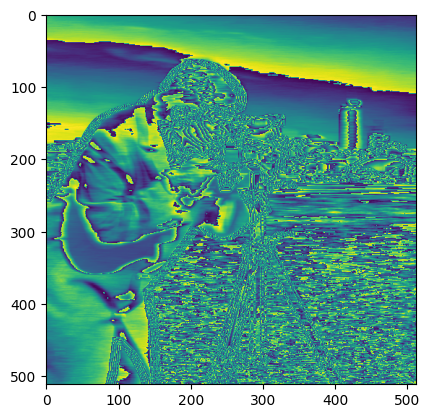

In [55]:
# solution
from scipy.ndimage import convolve

image = data.camera()
horizontal_mask = np.ones((1, 15))
filtered_image = convolve(image, horizontal_mask)
plt.imshow(filtered_image)

*   Convolve the image with a vertical mask:  (15 x 1) with all values set to ones

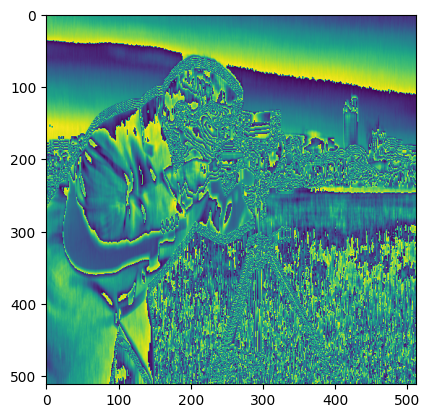

In [56]:
# solution
vertical_mask = np.ones((15, 1))
filtered_image = convolve(image, vertical_mask)
plt.imshow(filtered_image)


*   Convolve the image with a 2D mask:  (15 x 15) with all values set to ones

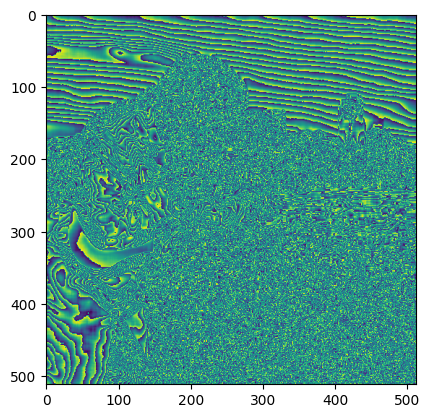

In [57]:
# solution

twodmask = np.ones((15, 15))
filtered_image = convolve(image, twodmask)
plt.imshow(filtered_image)

*   Visualize the original image, horizontal convolution, vertical convolution, 2D convolution using matplotlib subplot.

In [58]:
# solution



*   Apply 2 stage convolution: Horizontal mask (1 x 15) with all values set to 1 followed by vertical mask (15 x 1) with all values set to 1
*   Visualize the original image, 2D convolved image, 2 stage convolved image using matplotlib subplot.


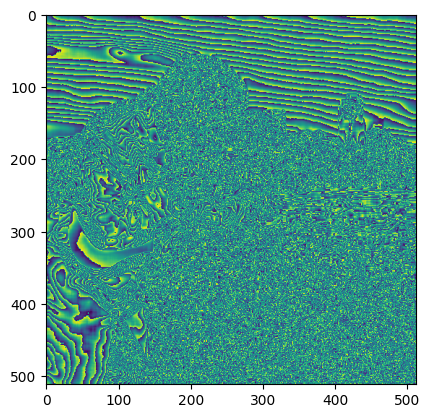

In [59]:
# solution
filtered_image = convolve(image, horizontal_mask)
filtered_image = convolve(filtered_image, vertical_mask)
plt.imshow(filtered_image)


*   Is the result different from applying convolution with 2D mask (15 x 15) with all values set to 1?

**Solution**

No

# Image Blurring

*   Why is blurring important?



**Solution**

- enhance image quality  
- prepare images for further analysis  
- achieve specific visual effects

### Exercise: Gaussian Filter
*   Read 'astronaut' image from the data module
*   Convert the image to grayscale.
*   Apply a gaussian filter with sigma=1
*   Hint: *gaussian function is available in skimage.filters module*

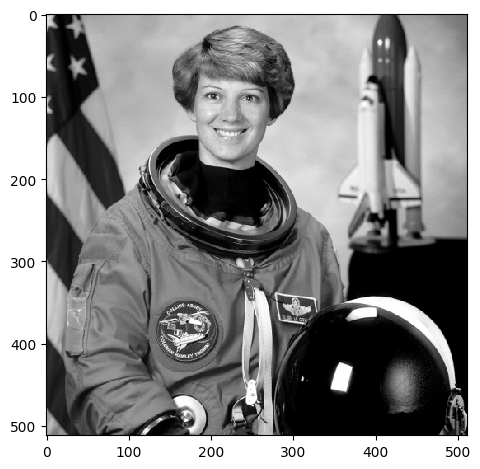

In [60]:
# solution

from skimage import io, color

astronut = data.astronaut()
gray_image = color.rgb2gray(astronut)

io.imshow(gray_image)
io.show()

*   Apply a gaussian filter with sigma=0. What is the result of this operation?

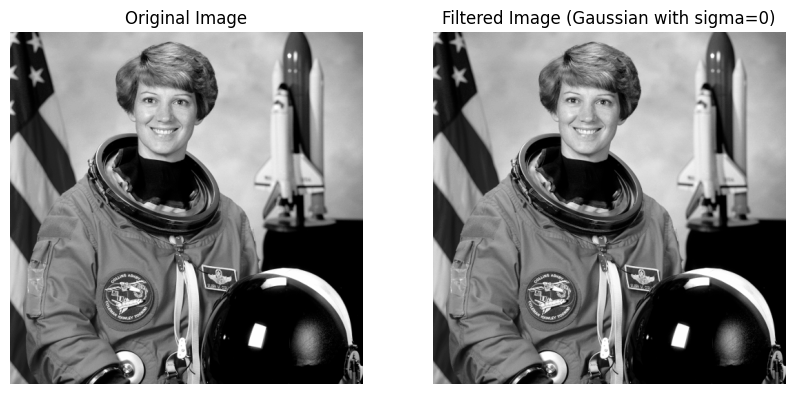

In [61]:
# solution
from skimage.filters import gaussian

filtered_image = gaussian(gray_image, sigma=0, preserve_range=True)

fig, ax = plt.subplots(1, 2, figsize=(10, 5))

ax[0].imshow(gray_image, cmap='gray')
ax[0].set_title('Original Image')
ax[0].axis('off')

ax[1].imshow(filtered_image, cmap='gray')
ax[1].set_title('Filtered Image (Gaussian with sigma=0)')
ax[1].axis('off')

plt.show()


*   Vary the value of sigma in the gaussian filter. Apply sigma=0.25, 0.5, 1, 1.5, 2, 5
*   Visualize the different results using matplotlib subplot.

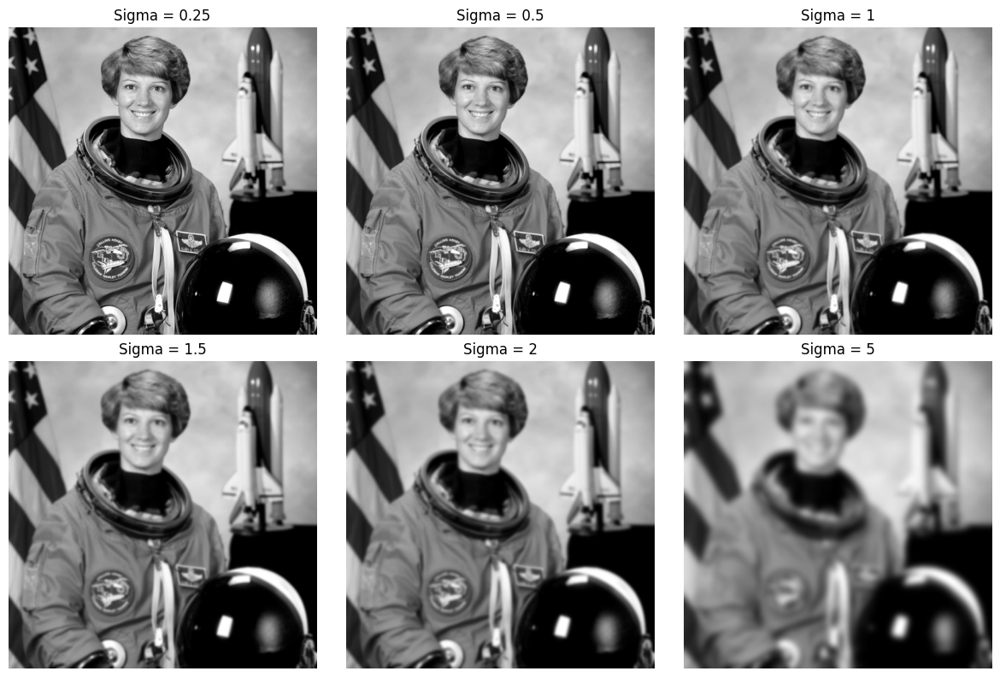

In [62]:
# solution
sigmas = [0.25, 0.5, 1, 1.5, 2, 5]

fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.ravel()

for i, sigma in enumerate(sigmas):
    filtered_image = filters.gaussian(gray_image, sigma=sigma)
    axes[i].imshow(filtered_image, cmap='gray')
    axes[i].set_title(f'Sigma = {sigma}')
    axes[i].axis('off')

plt.tight_layout()
plt.show()

*    What happens when a larger sigma value is used and what happens when a smaller sigma value is used in the gaussian filter?
*    What determines the optimal sigma value?




**Solution**

Smaller *sigma* values:  
- less smoothing  
- preserves details  
- less noise reduction  

Bigger *sigma* values:  
- more smoothing  
- greater blur  
- effective at reducing noise

### Exercise: Median Filter
*   Convert the 'astronauts' image to grayscale
*   Apply median filter with a disk structuring element of radius 1, 5, 10
*   Visualize the original image and the filtered image matplotlib subplot.

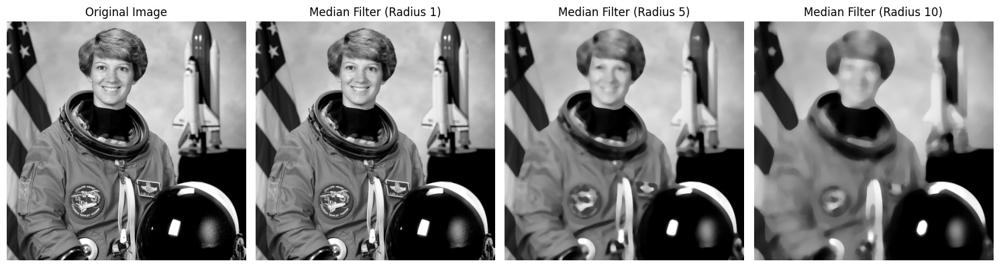

In [63]:
# solution
from skimage.morphology import disk
from skimage.filters.rank import median
from skimage import img_as_ubyte
radii = [1, 5, 10]

image = img_as_ubyte(gray_image)

fig, axes = plt.subplots(1, len(radii) + 1, figsize=(15, 5))
axes[0].imshow(image, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')

for i, radius in enumerate(radii):
    selem = disk(radius)
    
    filtered_image = median(image, selem)
    
    axes[i + 1].imshow(filtered_image, cmap='gray')
    axes[i + 1].set_title(f'Median Filter (Radius {radius})')
    axes[i + 1].axis('off')

plt.tight_layout()
plt.show()


*   Change the structuring element to square, rectangle and diamond
*   Visualize the original image and the filtered image using matplotlib

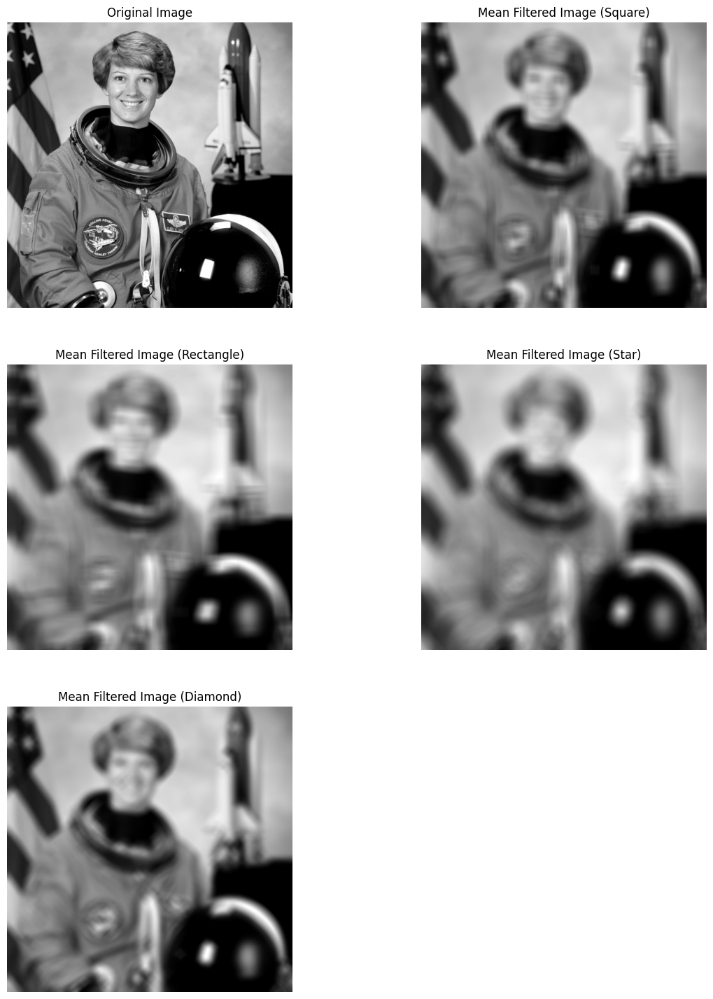

In [64]:
# solution

from skimage.filters.rank import mean
from skimage.morphology import square, rectangle, star, diamond
selem_square = square(17) 
selem_rectangle = rectangle(17, 29) 
selem_star = star(13)  
selem_diamond = diamond(11) 

filtered_image_square = mean(image, selem_square)
filtered_image_rectangle = mean(image, selem_rectangle)
filtered_image_star = mean(image, selem_star)
filtered_image_diamond = mean(image, selem_diamond)

fig, ax = plt.subplots(3, 2, figsize=(14, 18))

ax[0, 0].imshow(image, cmap='gray')
ax[0, 0].set_title('Original Image')
ax[0, 0].axis('off')

ax[0, 1].imshow(filtered_image_square, cmap='gray')
ax[0, 1].set_title('Mean Filtered Image (Square)')
ax[0, 1].axis('off')

ax[1, 0].imshow(filtered_image_rectangle, cmap='gray')
ax[1, 0].set_title('Mean Filtered Image (Rectangle)')
ax[1, 0].axis('off')

ax[1, 1].imshow(filtered_image_star, cmap='gray')
ax[1, 1].set_title('Mean Filtered Image (Star)')
ax[1, 1].axis('off')

ax[2, 0].imshow(filtered_image_diamond, cmap='gray')
ax[2, 0].set_title('Mean Filtered Image (Diamond)')
ax[2, 0].axis('off')

fig.delaxes(ax[2, 1])

plt.show()

*   What is the effect of the structuring element on the median filter?


**Solution**

*(Double-click or enter to edit)*

...

*   What is the difference between gaussian filter, mean filter and median filter?
*   Provide an example where each one would be used.


**Solution**

Gaussian filter smooths images by reducing high-frequency noise and details while preserving edges.  
Gaussian filters are commonly used in image preprocessing tasks such as noise reduction, image smoothing, and preparing images for subsequent processing steps like edge detection or segmentation.

Mean filter smooths images by reducing variations between neighboring pixel intensities.  
Mean filters are used for basic noise reduction, smoothing, and blurring operations where preserving fine details and edges is not critical.

Median filters are effective in reducing isolated outliers in images without blurring edges.  
Median filters are used in scenarios where preserving edge information and removing noise outliers are critical.

### Exercise: Effect of noise

It is easy to add noise to an image using the random_noise function available in skimage.util

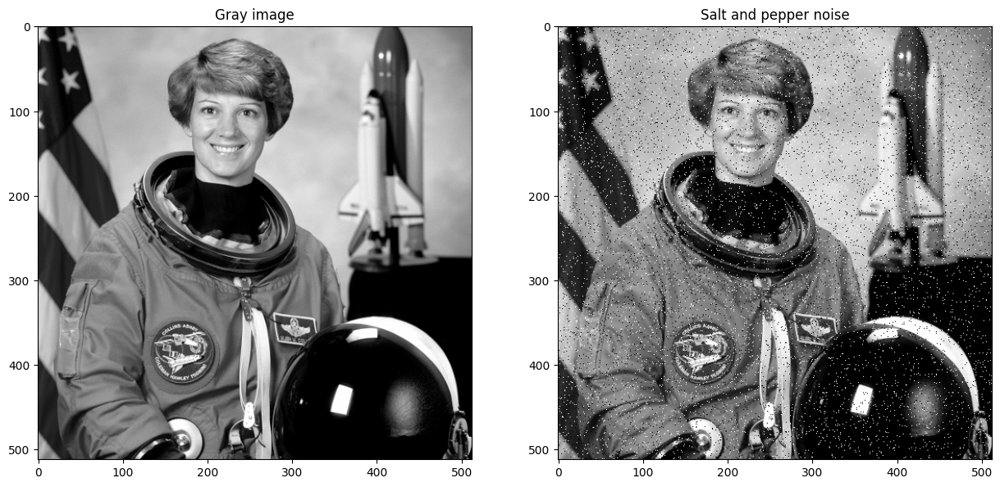

In [65]:
from skimage.util import random_noise
image = data.astronaut()
image = color.rgb2gray(image)

img_noise = random_noise(image, mode='s&p')  # salt and pepper noise is added

fig, ax = plt.subplots(ncols=2, nrows=1, figsize=(15, 7))

ax[0].imshow(image, cmap='gray')
ax[0].set_title('Gray image')
ax[1].imshow(img_noise, cmap='gray')
ax[1].set_title('Salt and pepper noise')

plt.show()

*   Create noisy images with **gaussian** noise and **salt and pepper** noise.
*   Apply mean filter, median filter and gaussian filter in each of the noisy images.
*   Visualize the images and observe the difference in each filter with respect to the noise.

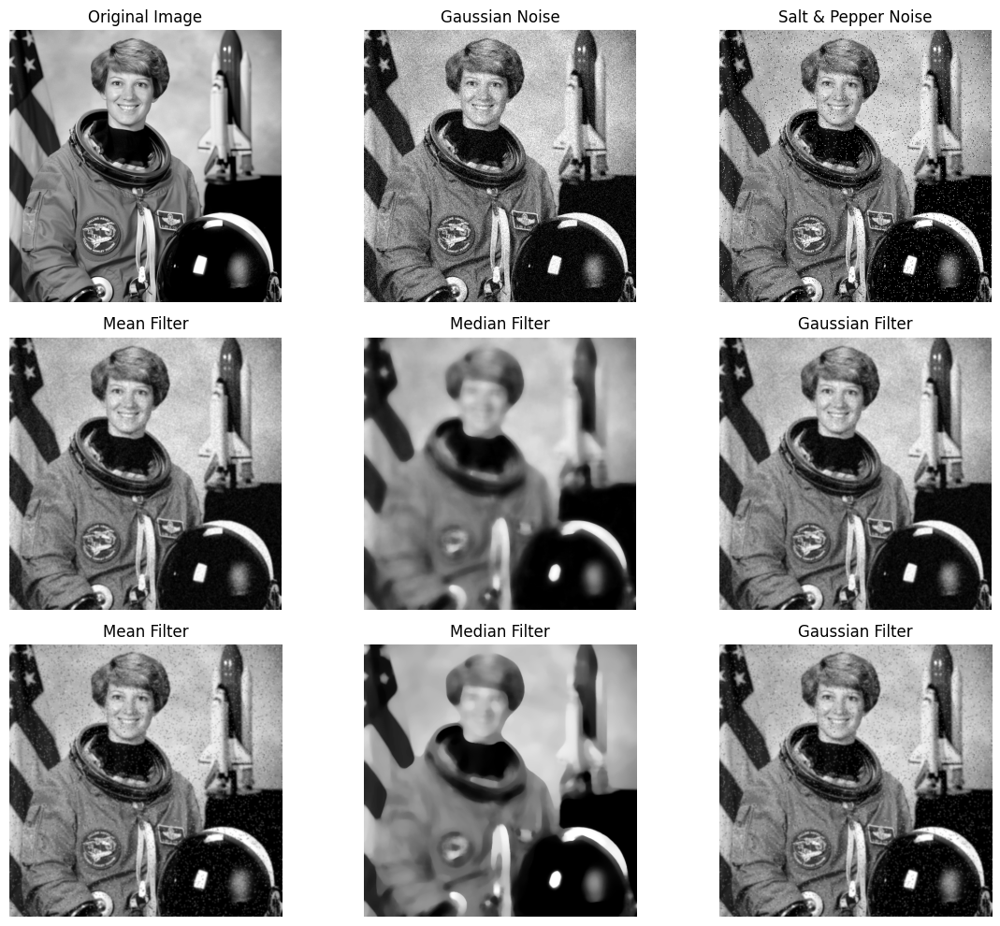

In [66]:
# solution
from skimage.filters import median, gaussian

def generate_noisy_images(image, sigma_gaussian=0.1, amount_sp=0.05):
    noisy_image_gaussian = random_noise(image, mode='gaussian', var=sigma_gaussian**2)
    noisy_image_sp = random_noise(image, mode='s&p', amount=amount_sp)
    return noisy_image_gaussian, noisy_image_sp


def apply_filters_and_visualize(original_image):
    noisy_image_gaussian, noisy_image_sp = generate_noisy_images(original_image)
    
    filtered_mean_gaussian = gaussian(noisy_image_gaussian, sigma=1)
    filtered_median_gaussian = median(noisy_image_gaussian, selem)
    filtered_gaussian_gaussian = gaussian(noisy_image_gaussian, sigma=1)
    
    filtered_mean_sp = gaussian(noisy_image_sp, sigma=1)
    filtered_median_sp = median(noisy_image_sp, selem)
    filtered_gaussian_sp = gaussian(noisy_image_sp, sigma=1)
    
    fig, axes = plt.subplots(3, 3, figsize=(12, 10))
    
    axes[0, 0].imshow(original_image, cmap='gray')
    axes[0, 0].set_title('Original Image')
    axes[0, 0].axis('off')
    
    axes[0, 1].imshow(noisy_image_gaussian, cmap='gray')
    axes[0, 1].set_title('Gaussian Noise')
    axes[0, 1].axis('off')
    
    axes[0, 2].imshow(noisy_image_sp, cmap='gray')
    axes[0, 2].set_title('Salt & Pepper Noise')
    axes[0, 2].axis('off')
    
    axes[1, 0].imshow(filtered_mean_gaussian, cmap='gray')
    axes[1, 0].set_title('Mean Filter')
    axes[1, 0].axis('off')
    
    axes[1, 1].imshow(filtered_median_gaussian, cmap='gray')
    axes[1, 1].set_title('Median Filter')
    axes[1, 1].axis('off')
    
    axes[1, 2].imshow(filtered_gaussian_gaussian, cmap='gray')
    axes[1, 2].set_title('Gaussian Filter')
    axes[1, 2].axis('off')
    
    axes[2, 0].imshow(filtered_mean_sp, cmap='gray')
    axes[2, 0].set_title('Mean Filter')
    axes[2, 0].axis('off')
    
    axes[2, 1].imshow(filtered_median_sp, cmap='gray')
    axes[2, 1].set_title('Median Filter')
    axes[2, 1].axis('off')
    
    axes[2, 2].imshow(filtered_gaussian_sp, cmap='gray')
    axes[2, 2].set_title('Gaussian Filter')
    axes[2, 2].axis('off')
    
    plt.tight_layout()
    plt.show()

apply_filters_and_visualize(gray_image)

*   Which filter works better for gaussian noise and which filter works better for salt and pepper noise? Explain your choice of the filter for that particular type of noise.


**Solution**

Gaussian filter works better for gaussian noise and median filter for salt and pepper noise.

# Image Sharpening

A sharpening filter can be broken down into two steps: It takes a smoothed image, subtracts it from the original image to obtain the "details" of the image, and adds the "details" to the original image.

enhanced image = original + amount * (original - blurred)

### Exercise:
*   Read 'moon' image from the data module
*   Perform smoothing using a gaussian filter of sigma 1
*   Subtract the smoothened image from the original image.
*   Enhance the image with amount=1
*   Visualize each of the steps using matplotlib

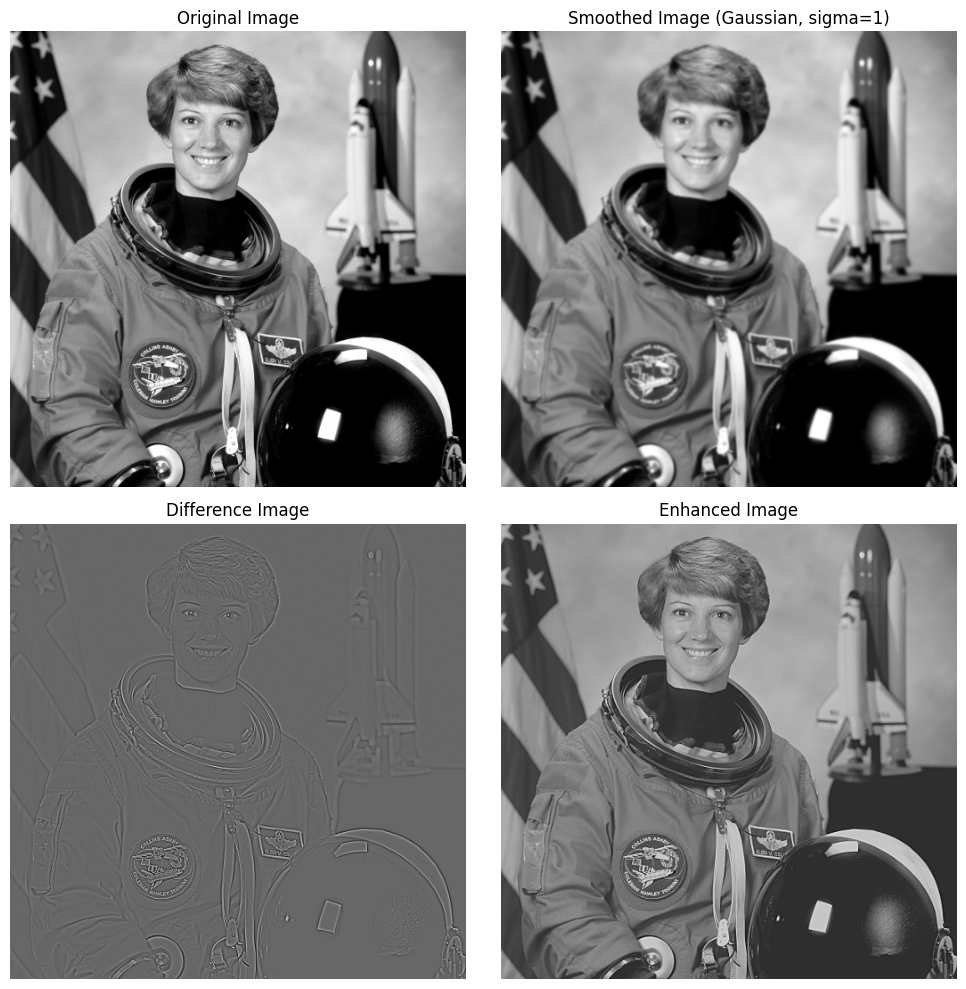

In [67]:
# solution
smoothed_image = filters.gaussian(gray_image, sigma=1)
difference_image = gray_image - smoothed_image
blurred_image = filters.gaussian(gray_image, sigma=1)
enhanced_image = gray_image + 1 * (gray_image - blurred_image)

fig, axes = plt.subplots(2, 2, figsize=(10, 10))

axes[0, 0].imshow(gray_image, cmap='gray')
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

axes[0, 1].imshow(smoothed_image, cmap='gray')
axes[0, 1].set_title('Smoothed Image (Gaussian, sigma=1)')
axes[0, 1].axis('off')

axes[1, 0].imshow(difference_image, cmap='gray')
axes[1, 0].set_title('Difference Image')
axes[1, 0].axis('off')

axes[1, 1].imshow(enhanced_image, cmap='gray')
axes[1, 1].set_title('Enhanced Image')
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()


*   Keeping amount=1, change the value of sigma=5,10 and repeat the enhancements
*   Using the best sigma value, vary the amount value=0.5,2,5,10
*   Visualize the sharpened images using matplotlib

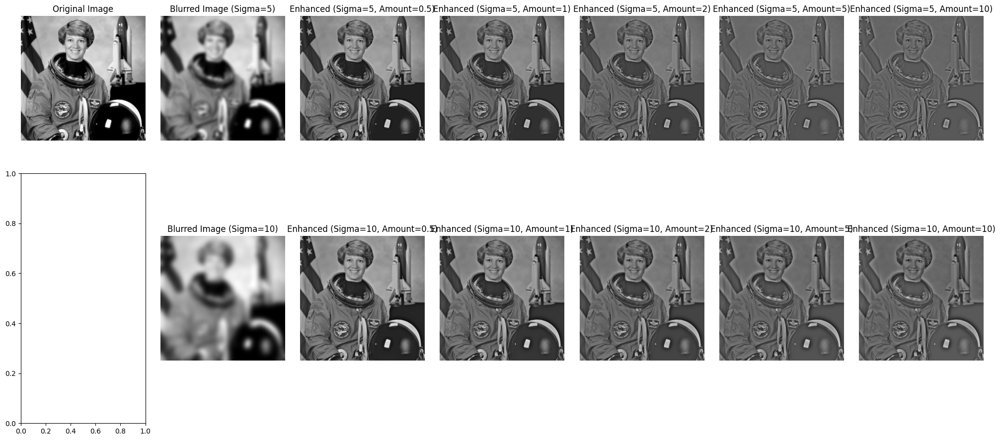

In [68]:
# solution
sigmas = [5, 10]
amounts = [0.5, 1, 2, 5, 10]

fig, axes = plt.subplots(len(sigmas), len(amounts) + 2, figsize=(20, 10))

axes[0, 0].imshow(gray_image, cmap='gray')
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

for i, sigma in enumerate(sigmas):
    blurred_image = filters.gaussian(gray_image, sigma=sigma)
    
    axes[i, 1].imshow(blurred_image, cmap='gray')
    axes[i, 1].set_title(f'Blurred Image (Sigma={sigma})')
    axes[i, 1].axis('off')
    
    for j, amount in enumerate(amounts):
        enhanced_image = gray_image + amount * (gray_image - blurred_image)
        
        axes[i, j + 2].imshow(enhanced_image, cmap='gray')
        axes[i, j + 2].set_title(f'Enhanced (Sigma={sigma}, Amount={amount})')
        axes[i, j + 2].axis('off')

plt.tight_layout()
plt.show()


# Edge Detection

### Exercise:
*   Read 'camera' image from the data module
*   Perform sobel, prewitt and roberts edge detection on the image
*   Visualize the original image, the edges and the edges superimposed on the original image

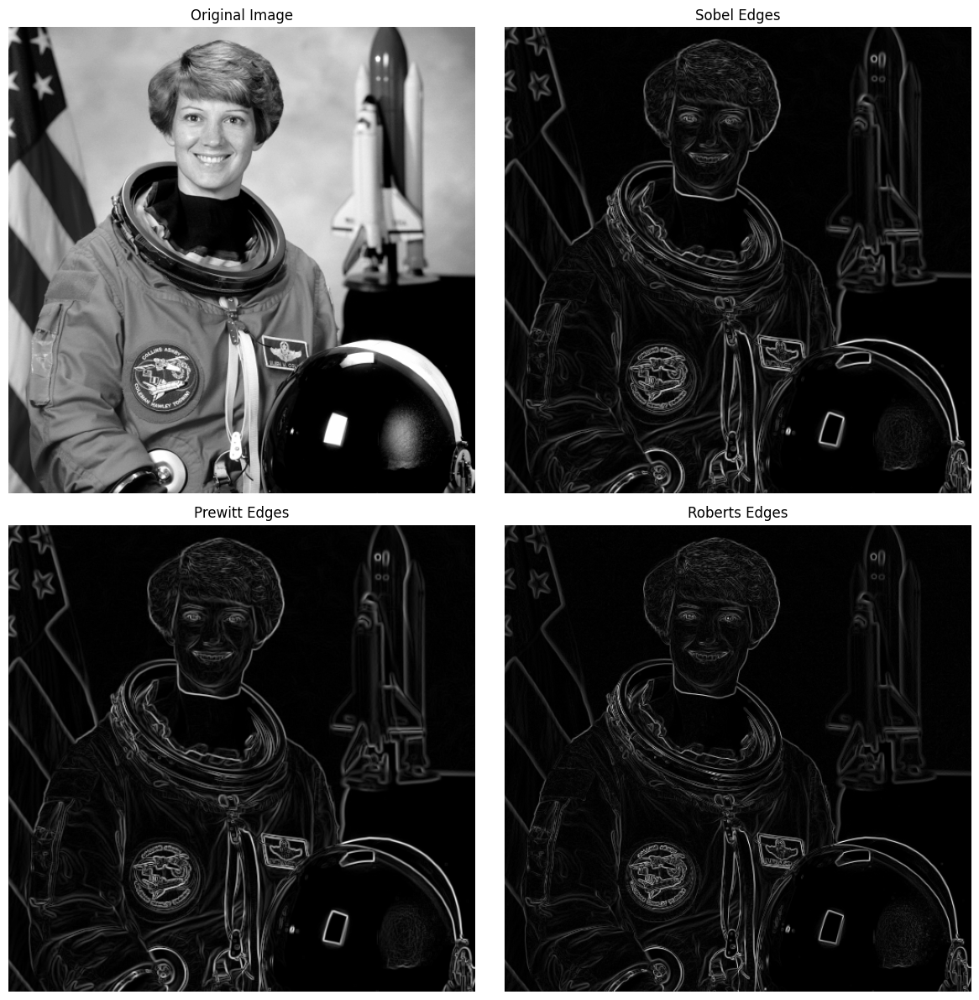

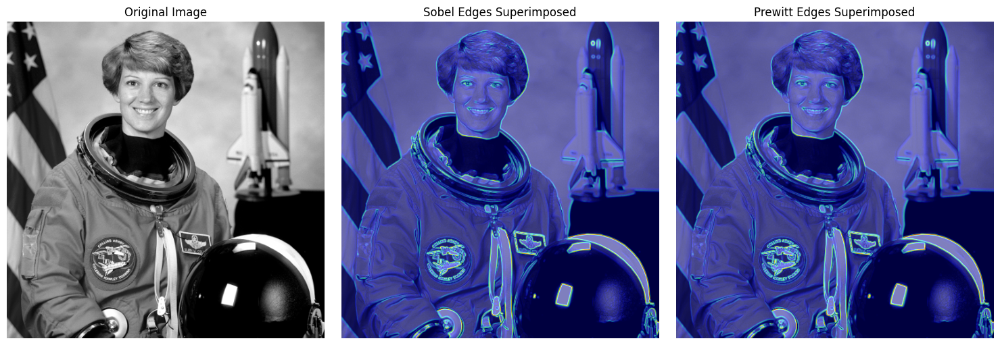

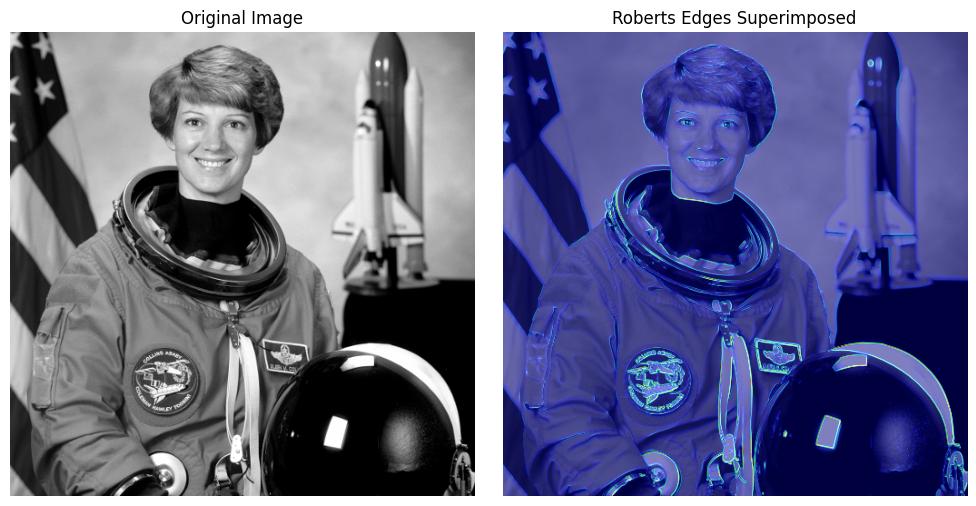

In [69]:
# solution

from skimage import io, color, filters

edges_sobel = filters.sobel(gray_image)
edges_prewitt = filters.prewitt(gray_image)
edges_roberts = filters.roberts(gray_image)

fig, axes = plt.subplots(2, 2, figsize=(12, 12))

axes[0, 0].imshow(gray_image, cmap='gray')
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

axes[0, 1].imshow(edges_sobel, cmap='gray')
axes[0, 1].set_title('Sobel Edges')
axes[0, 1].axis('off')

axes[1, 0].imshow(edges_prewitt, cmap='gray')
axes[1, 0].set_title('Prewitt Edges')
axes[1, 0].axis('off')

axes[1, 1].imshow(edges_roberts, cmap='gray')
axes[1, 1].set_title('Roberts Edges')
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(gray_image, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(gray_image, cmap='gray')
axes[1].imshow(edges_sobel, cmap='jet', alpha=0.5)
axes[1].set_title('Sobel Edges Superimposed')
axes[1].axis('off')

axes[2].imshow(gray_image, cmap='gray')
axes[2].imshow(edges_prewitt, cmap='jet', alpha=0.5)
axes[2].set_title('Prewitt Edges Superimposed')
axes[2].axis('off')

plt.tight_layout()
plt.show()

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

axes[0].imshow(gray_image, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(gray_image, cmap='gray')
axes[1].imshow(edges_roberts, cmap='jet', alpha=0.5)
axes[1].set_title('Roberts Edges Superimposed')
axes[1].axis('off')

plt.tight_layout()
plt.show()


*   What is the difference between each of the edge detectors?
*   What does you think is the limitation of each of the detector?



**Solution**

[Source](https://sbme-tutorials.github.io/2018/cv/notes/4_week4.html)

Sobel operator amplifies noise because it calculates derivatives, which are sensitive to variations in pixel values. This can lead to false edge detections in noisy images.
Sobel operator uses a relatively small kernel (3x3 or 5x5), which may result in blurry edges. It tends to smooth over fine details and can miss edges that are not aligned with the vertical or horizontal directions.

Prewitt operator shares similar limitations with Sobel, such as sensitivity to noise, potential for blurry edges, and directional sensitivity.

Roberts operator is highly sensitive to noise because it calculates derivatives using only 2x2 pixel neighborhoods. This can lead to noisy edge detections and false positives.
Roberts operator is particularly effective for detecting diagonal edges due to its diagonal kernel. However, it may miss edges that are vertical or horizontal.

### Exercise: Canny edge detector
*   Read 'camera' image from the data module
*   Apply canny operator with default parameters
*   Apply canny by varying sigma=1, 3, 5, 10
*   Visualize the original image along with the edges detected using matplotlib.

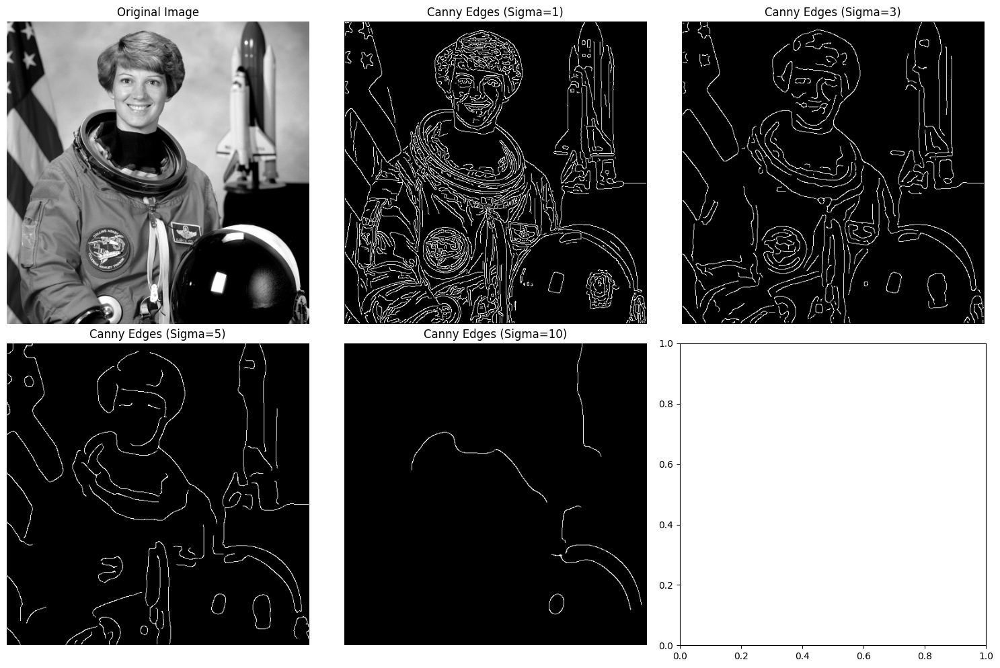

In [70]:
# solution

edges_default = feature.canny(gray_image)

sigmas = [1, 3, 5, 10]
edges_sigma = {}

for sigma in sigmas:
    edges_sigma[sigma] = feature.canny(gray_image, sigma=sigma)

fig, axes = plt.subplots(2, 3, figsize=(15, 10))

axes[0, 0].imshow(gray_image, cmap='gray')
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

axes[0, 1].imshow(edges_default, cmap='gray')
axes[0, 1].set_title('Canny Edges (Default)')
axes[0, 1].axis('off')

for i, sigma in enumerate(sigmas):
    axes[(i+1)//3, (i+1)%3].imshow(edges_sigma[sigma], cmap='gray')
    axes[(i+1)//3, (i+1)%3].set_title(f'Canny Edges (Sigma={sigma})')
    axes[(i+1)//3, (i+1)%3].axis('off')

plt.tight_layout()
plt.show()

*   What is the effect of varying the sigma values on the edges?
*   What do the high threshold and low threshold parameters denote?


**Solution**

Varying the sigma values in Canny edge detection affects the amount of smoothing applied to the image before edge detection, which in turn affects the thickness and detection of edges. High and low thresholds in Canny edge detection define the criteria for classifying pixels as strong or weak edge candidates, influencing the final detected edges in the image.

*   What is the algorithm behind the Canny operator?


**Solution**

The Canny edge detection algorithm is designed to detect a wide range of edges in an image while handling noise robustly. It combines Gaussian smoothing, gradient calculation, non-maximum suppression, double thresholding, and edge tracking by hysteresis to achieve accurate and reliable edge detection results. 